In [1]:
#merge old_annotations & new_annotations

In [1]:
#Import dependent modules
import matplotlib.pyplot as plt
import numpy as np
import os, sys, cv2
import random
import json
%matplotlib inline

In [2]:
#Load necessary data

#There are four kinds of label in CalTech Pedestrian data set
label_set = {'person', 'people', 'person-fa', 'person?'}  

#Load the ground truth annotation. You shold specify the file path of json ground truth
old_anno_path = "/root/data/data/caltech-pedestrian-dataset-converter/data/annotations.json"
new_anno_path = "/root/data/data/caltech-pedestrian-dataset-converter/data/new_anno.json"
old_annotation = json.load(open(old_anno_path))
new_annotation = json.load(open(new_anno_path))

In [3]:
def get_frames(gt_annotation):

    target_frames = []
    for set_num, set_annotation in gt_annotation.items():
        for v_num, v_annotation in set_annotation.items():
            for frame_num, boxes in v_annotation["frames"].items():
                filtered_box = [box for box in boxes ]
                
                #Only the the frames contain valid boxes are returned
                if len(filtered_box) > 0:
                    frame_name = "{}_{}_{}.jpg".format(set_num, v_num, frame_num)
                    target_frames.append((frame_name, filtered_box))
                      
    return target_frames
def get_boxes(gt_annotation, frame_name):
    set_num, v_num, frame_num = frame_name[:-4].split("_")
    if frame_num not in gt_annotation[set_num][v_num]["frames"].keys():
        return []
    return gt_annotation[set_num][v_num]["frames"][frame_num]

In [4]:
def overlap(old_boxes,new_x,new_y,new_box_area):
    for box in old_boxes:
        x_bound = (box['pos'][0],box['pos'][0] + box['pos'][2])
        y_bound = (box['pos'][1],box['pos'][1] + box['pos'][3])
        length = 0
        width = 0
        for i in range(0,4):
            if (new_x[i] < x_bound[1] and new_x[i] > x_bound[0]) or (new_y[i] < y_bound[1] and new_y[i] > y_bound[0]):
                if i == 0:
                    length = min(new_y[2],y_bound[1]) - new_y[i]
                    width = min(new_x[2],x_bound[1]) - new_x[i]
                    break
                elif i == 1:
                    length = new_y[i] - max(y_bound[0],new_y[0])
                    width = min(x_bound[1],new_x[2]) - new_x[i]
                    break
                elif i == 2:
                    length = new_y[i] - max(y_bound[0],new_y[0])
                    width = new_x[i] - max(x_bound[0],new_x[0])
                    break
                elif i == 3:
                    length = min(new_y[2],y_bound[1]) - new_y[i]
                    width = new_x[i] - max(x_bound[0],new_x[0])
                    break
        overlap_area = length * width
        if float(overlap_area) / new_box_area >= 0.5:
            box['replace'] = 1
    return old_boxes

In [14]:
#A function that renders the image with bounding boxes
def render_frame(frame_name, boxes, compare_boxes):
    #You probably need to change the file path.
    images_path = "/root/data/data/caltech-pedestrian-dataset-converter/data/images"
    
    frame_path = os.path.join(images_path, frame_name)
    im = cv2.imread(frame_path)[:, :, (2, 1, 0)]
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(im, aspect='equal')
    
    label_to_color = {"people": "red", "person": "green", "person-fa": "blue", "person?": "yellow","ignore" : "orange"}
    
  
    for box in compare_boxes:
        box['replace'] = 0
        
    for box in boxes:
        x = [0,0,0,0]
        y = [0,0,0,0]
        x[0] = box['pos'][0]
        y[0] = box['pos'][1]
        width = box['pos'][2]
        length = box['pos'][3]
        label = box['lbl']
        (x[1],y[1]) = (x[0],y[0] + length)
        (x[2],y[2]) = (x[0] + width,y[0] + length)
        (x[3],y[3]) = (x[0] + width,y[0])
        area = width * length
        
        compare_boxes = overlap(compare_boxes,x,y,area)
            
        color = label_to_color[label]
        rectangle = plt.Rectangle((x[0],y[0]), width,length, fill=False, edgecolor=color, linewidth=1.5)
        ax.add_patch(rectangle)
        ax.text(x[0], y[0] - 2, label,
                bbox=dict(facecolor=color, alpha=0.5),
                fontsize=14, color='white')
        
    for box in compare_boxes:
        #print "box",box
        if box['replace'] == 0:
            x1 = box['pos'][0]
            y1 = box['pos'][1]
            width = box['pos'][2]
            length = box['pos'][3]
            label = box['lbl']
            color = label_to_color[label]
            #color = "green"
            rectangle = plt.Rectangle((x1,y1), width,length, fill=False, edgecolor=color, linewidth=1.5, \
                                      linestyle='dashed')
            ax.add_patch(rectangle)
            ax.text(x1, y1 - 2, label,
                    bbox=dict(facecolor=color, alpha=0.5),
                    fontsize=14, color='white')
            
    
    ax.set_title(frame_name)  
    plt.axis('off')
    plt.tight_layout()
    plt.draw()

In [15]:
#Apply the specified box_filter and verify it by rendering N images with the filtered bounding boxes
#A comparing filter can also be applied. The boxes from the comparing filter are dotted lines.
def verify_annotations(N,old_anno,new_anno):
    old_frames = get_frames(old_anno)
    new_frames = get_frames(new_anno)
    old_bbox_count = 0
    new_bbox_count = 0
    for _, bboxes in old_frames:
        old_bbox_count += len(bboxes)
    for _, bboxes in new_frames:
        new_bbox_count += len(bboxes)
        
    
    
    print("Old:{} frames and {} bbox".format(len(old_frames), old_bbox_count))
    print("New:{} frames and {} bbox".format(len(new_frames), new_bbox_count))
    sampled_indices =  random.sample(range(len(new_frames)) ,N)

    #Render the selected images
    for sampled_index in sampled_indices :
        print "sampled index",sampled_index
        frame_name, boxes = new_frames[sampled_index]
        
        compare_boxes = get_boxes(old_anno,frame_name)
        #print compare_boxes
        #print boxes
        render_frame(frame_name, boxes, compare_boxes)

Old:132082 frames and 346621 bbox
New:5039 frames and 18152 bbox
sampled index 880
sampled index 2570
sampled index 4911
sampled index 3278
sampled index 159
sampled index 3451
sampled index 3295
sampled index 1560
sampled index 139
sampled index 2969
sampled index 4666
sampled index 761
sampled index 1187
sampled index 1113
sampled index 4442


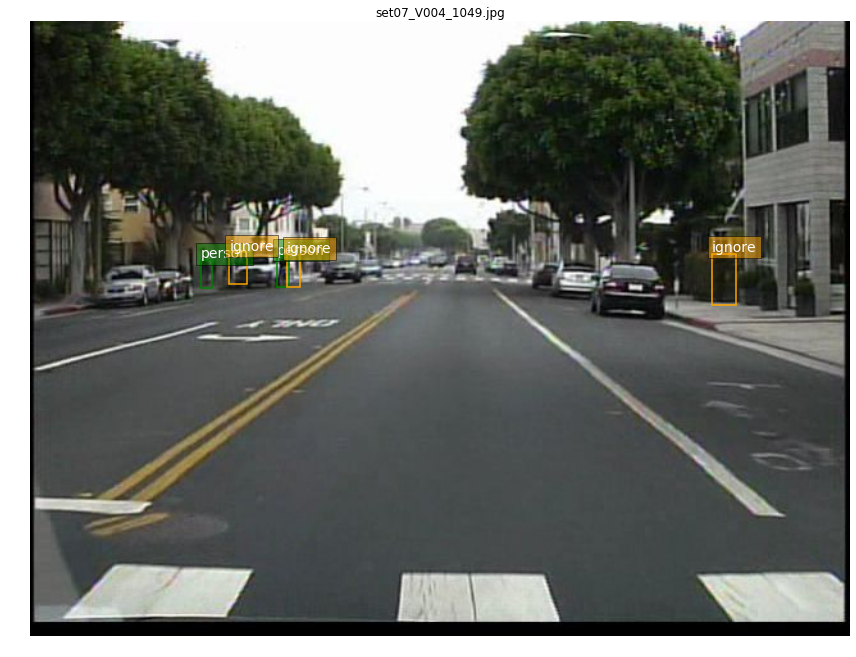

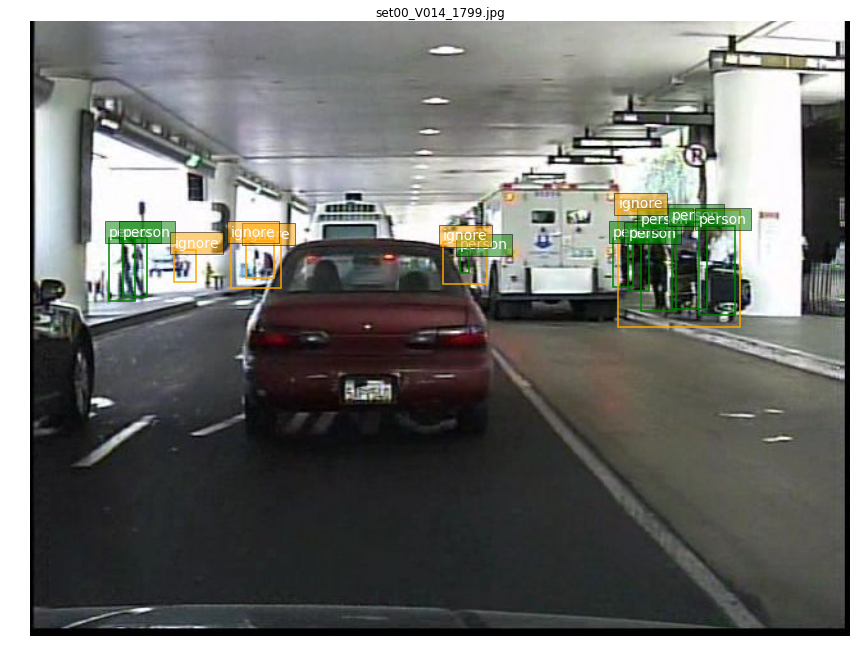

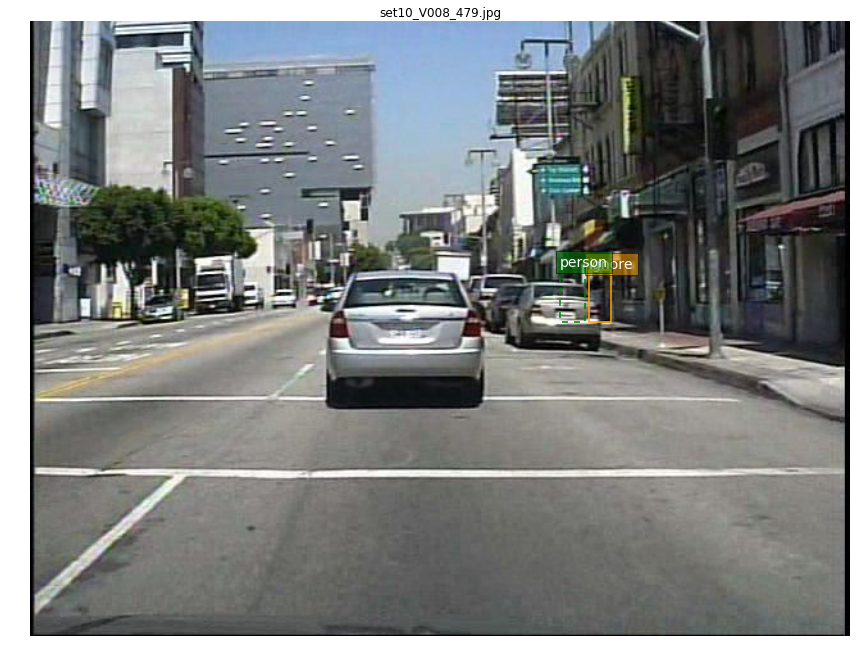

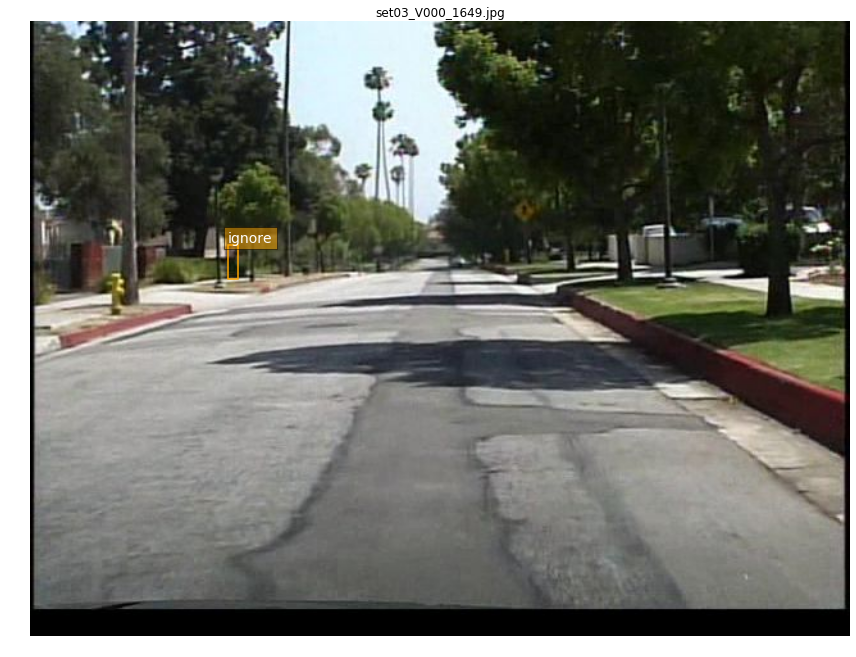

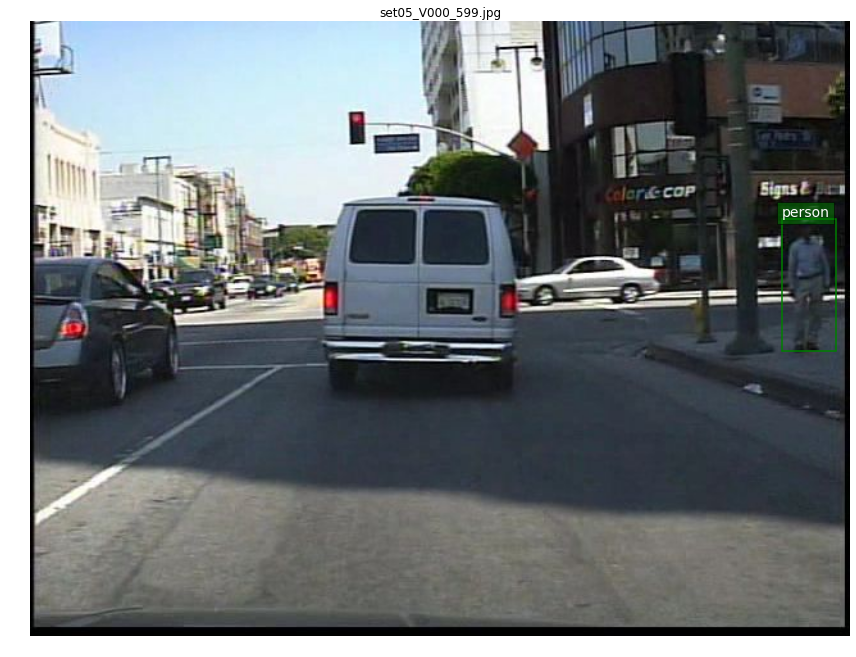

...

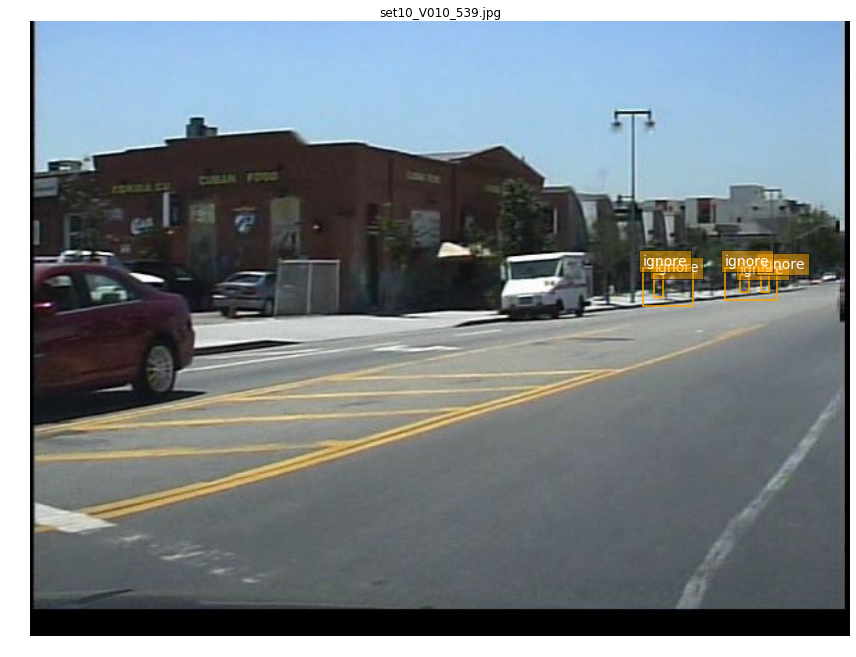

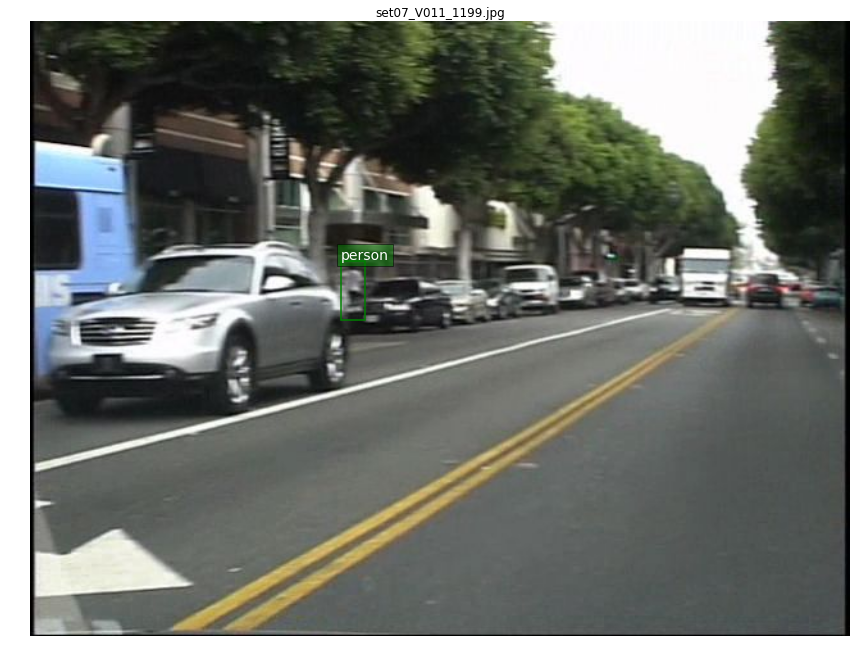

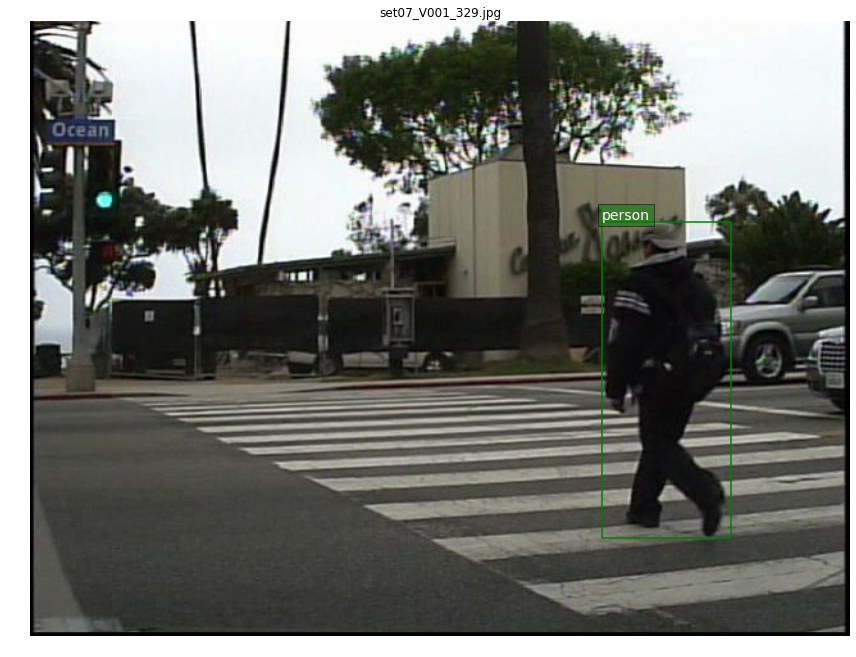

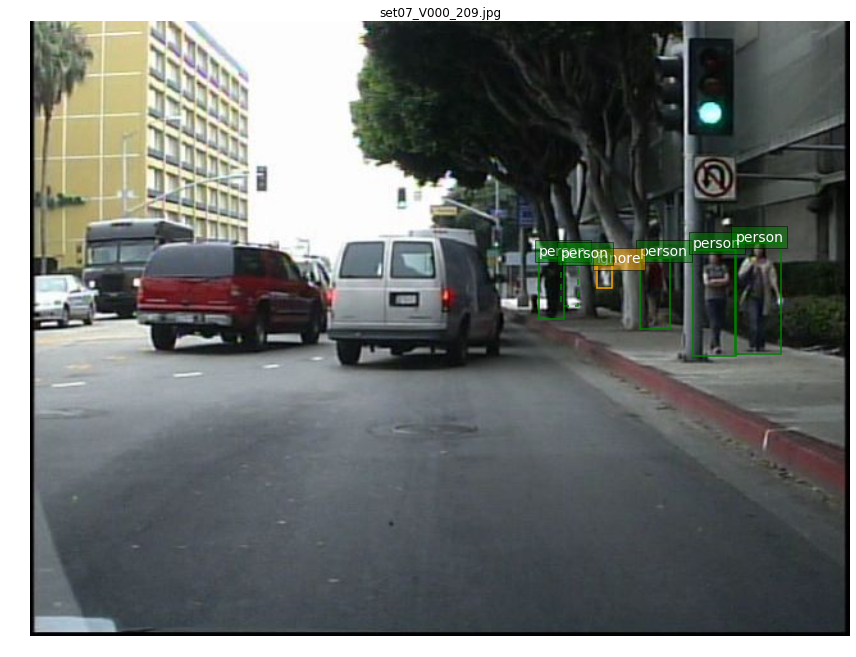

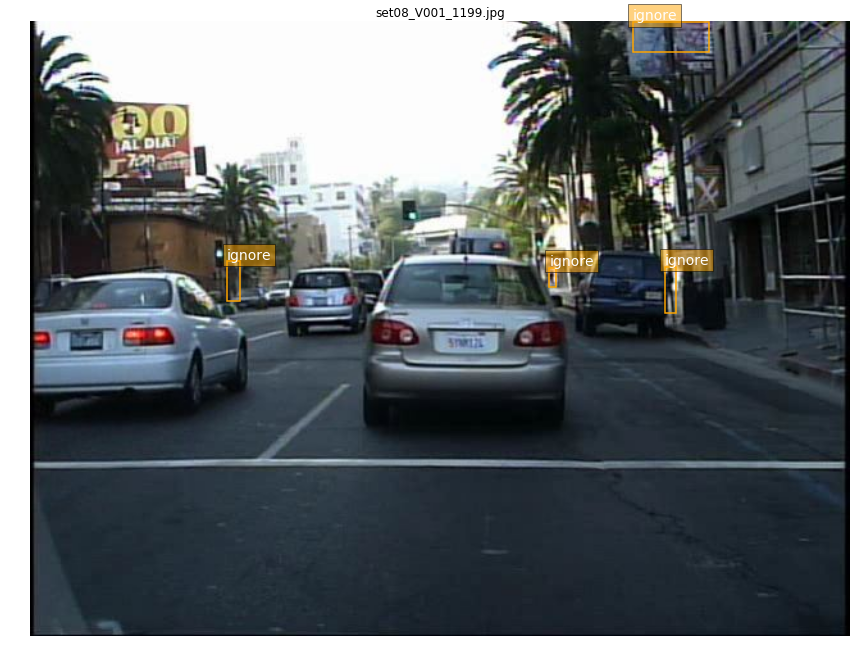

In [16]:
verify_annotations(15,old_annotation,new_annotation)